In [42]:
!pip install plotly.express

In [43]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import plotly.express as px


In [2]:
df = pd.read_csv("F:\\Video Games EDA\\backloggd_games.csv")


In [3]:
df.columns

Index(['Unnamed: 0', 'Title', 'Release_Date', 'Developers', 'Summary',
       'Platforms', 'Genres', 'Rating', 'Plays', 'Playing', 'Backlogs',
       'Wishlist', 'Lists', 'Reviews'],
      dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    60000 non-null  int64  
 1   Title         60000 non-null  object 
 2   Release_Date  60000 non-null  object 
 3   Developers    60000 non-null  object 
 4   Summary       55046 non-null  object 
 5   Platforms     60000 non-null  object 
 6   Genres        60000 non-null  object 
 7   Rating        25405 non-null  float64
 8   Plays         60000 non-null  object 
 9   Playing       60000 non-null  object 
 10  Backlogs      60000 non-null  object 
 11  Wishlist      60000 non-null  object 
 12  Lists         60000 non-null  object 
 13  Reviews       60000 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 6.4+ MB


In [5]:
df.head()

,Unnamed: 0,Title,Release_Date,Developers,Summary,Platforms,Genres,Rating,Plays,Playing,Backlogs,Wishlist,Lists,Reviews
0,0,Elden Ring,"Feb 25, 2022","['FromSoftware', 'Bandai Namco Entertainment']","Elden Ring is a fantasy, action and open world...","['Windows PC', 'PlayStation 4', 'Xbox One', 'P...","['Adventure', 'RPG']",4.5,21K,4.1K,5.6K,5.5K,4.6K,3K
1,1,The Legend of Zelda: Breath of the Wild,"Mar 03, 2017","['Nintendo', 'Nintendo EPD Production Group No...",The Legend of Zelda: Breath of the Wild is the...,"['Wii U', 'Nintendo Switch']","['Adventure', 'Puzzle']",4.4,35K,3.1K,5.6K,3K,5.1K,3K
2,2,Hades,"Dec 07, 2018",['Supergiant Games'],A rogue-lite hack and slash dungeon crawler in...,"['Windows PC', 'Mac', 'PlayStation 4', 'Xbox O...","['Adventure', 'Brawler', 'Indie', 'RPG']",4.3,25K,3.5K,7.3K,4K,3.2K,2.1K
3,3,Hollow Knight,"Feb 24, 2017",['Team Cherry'],A 2D metroidvania with an emphasis on close co...,"['Windows PC', 'Mac', 'Linux', 'Nintendo Switch']","['Adventure', 'Indie', 'Platform']",4.4,25K,2.7K,9.6K,2.6K,3.4K,2.1K
4,4,Undertale,"Sep 15, 2015","['tobyfox', '8-4']","A small child falls into the Underground, wher...","['Windows PC', 'Mac', 'Linux', 'PlayStation 4'...","['Adventure', 'Indie', 'RPG', 'Turn Based Stra...",4.2,32K,728,5.7K,2.1K,3.9K,2.5K


<AxesSubplot:>

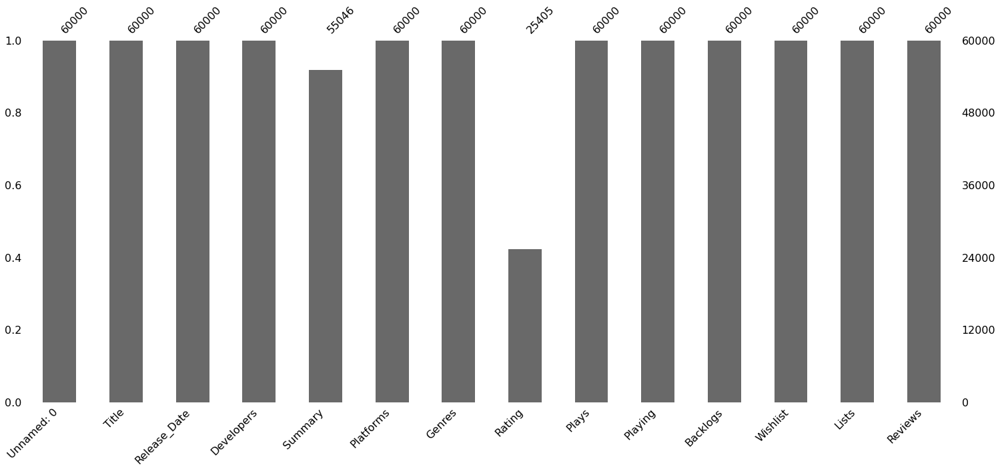

In [6]:
msno.bar(df)

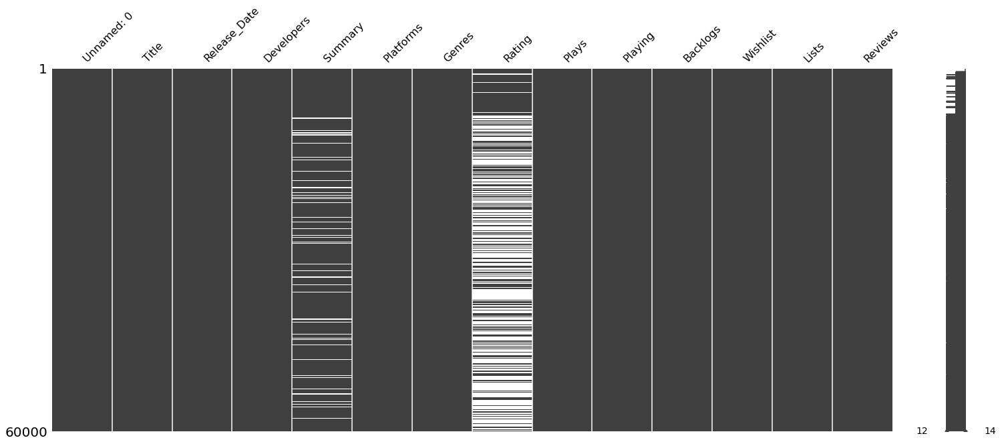

In [7]:
msno.matrix(df);

In [8]:
df.describe()

,Unnamed: 0,Rating
count,60000.000000,25405.000000
mean,29999.500000,3.033171
std,17320.652413,0.735573
min,0.000000,0.300000
25%,14999.750000,2.600000
50%,29999.500000,3.100000
75%,44999.250000,3.500000
max,59999.000000,5.000000


In [9]:
df.columns

Index(['Unnamed: 0', 'Title', 'Release_Date', 'Developers', 'Summary',
       'Platforms', 'Genres', 'Rating', 'Plays', 'Playing', 'Backlogs',
       'Wishlist', 'Lists', 'Reviews'],
      dtype='object')

In [10]:

#As we can see we have many NaN in summery and Rating
print("Number of nulls in Summery : ",sum(df["Summary"].isnull()))
print("Number of nulls in Rating : ",sum(df["Rating"].isnull()))
# print("Number of nulls in genre : ",result_df = sum(df[df['Genres'] == 5])



Number of nulls in Summery :  4954
Number of nulls in Rating :  34595


In [11]:
# To fill my rating section i have first counted all the different genres 
# and then i calculated the mean value of rating with respect to each genre 
# After that i filled the rating column by its genre specific rating.


# Calculate the mean rating for each genre and store it in a new DataFrame
mean_ratings_by_genre = df.groupby('Genres')['Rating'].mean()

# Create a dictionary to map each genre to its mean rating
mean_rating_dict = mean_ratings_by_genre.to_dict()

# Fill the missing values in the 'Rating' column with the mean rating for the corresponding genre
df['Rating'] = df.apply(lambda row: mean_rating_dict[row['Genres']] if pd.isnull(row['Rating']) else row['Rating'], axis=1)

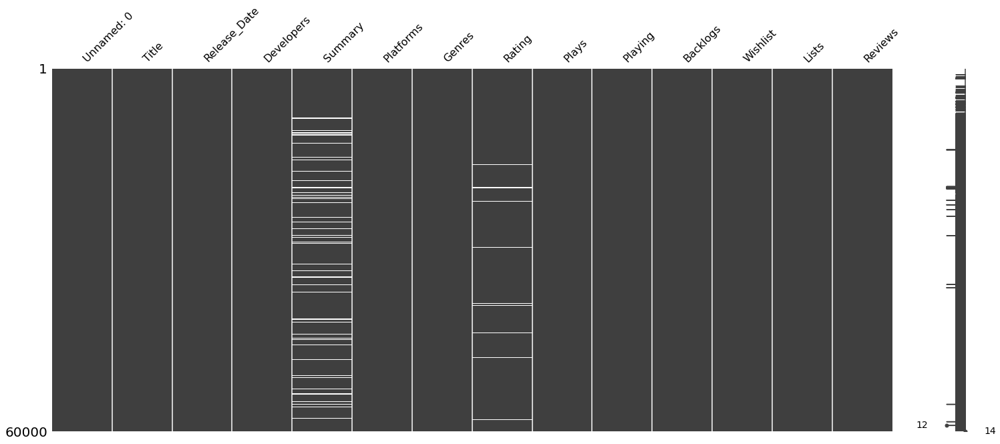

In [12]:
msno.matrix(df);

In [13]:
df.describe()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    60000 non-null  int64  
 1   Title         60000 non-null  object 
 2   Release_Date  60000 non-null  object 
 3   Developers    60000 non-null  object 
 4   Summary       55046 non-null  object 
 5   Platforms     60000 non-null  object 
 6   Genres        60000 non-null  object 
 7   Rating        59332 non-null  float64
 8   Plays         60000 non-null  object 
 9   Playing       60000 non-null  object 
 10  Backlogs      60000 non-null  object 
 11  Wishlist      60000 non-null  object 
 12  Lists         60000 non-null  object 
 13  Reviews       60000 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 6.4+ MB


In [14]:
#Removing all the rows in rating column

df = df[~df['Rating'].isnull()]

In [15]:
# Deleting the summery and index column

df = df.drop(['Summary','Unnamed: 0'], axis=1)

In [16]:
df.head(10)

,Title,Release_Date,Developers,Platforms,Genres,Rating,Plays,Playing,Backlogs,Wishlist,Lists,Reviews
0,Elden Ring,"Feb 25, 2022","['FromSoftware', 'Bandai Namco Entertainment']","['Windows PC', 'PlayStation 4', 'Xbox One', 'P...","['Adventure', 'RPG']",4.5,21K,4.1K,5.6K,5.5K,4.6K,3K
1,The Legend of Zelda: Breath of the Wild,"Mar 03, 2017","['Nintendo', 'Nintendo EPD Production Group No...","['Wii U', 'Nintendo Switch']","['Adventure', 'Puzzle']",4.4,35K,3.1K,5.6K,3K,5.1K,3K
2,Hades,"Dec 07, 2018",['Supergiant Games'],"['Windows PC', 'Mac', 'PlayStation 4', 'Xbox O...","['Adventure', 'Brawler', 'Indie', 'RPG']",4.3,25K,3.5K,7.3K,4K,3.2K,2.1K
3,Hollow Knight,"Feb 24, 2017",['Team Cherry'],"['Windows PC', 'Mac', 'Linux', 'Nintendo Switch']","['Adventure', 'Indie', 'Platform']",4.4,25K,2.7K,9.6K,2.6K,3.4K,2.1K
4,Undertale,"Sep 15, 2015","['tobyfox', '8-4']","['Windows PC', 'Mac', 'Linux', 'PlayStation 4'...","['Adventure', 'Indie', 'RPG', 'Turn Based Stra...",4.2,32K,728,5.7K,2.1K,3.9K,2.5K
5,Minecraft,"Nov 18, 2011",['Mojang Studios'],"['Windows PC', 'Mac', 'Linux']","['Adventure', 'Simulator']",4.3,38K,2.1K,1.3K,265,2.6K,2.7K
6,Omori,"Dec 25, 2020","['OMOCAT', 'PLAYISM']","['Windows PC', 'Mac', 'PlayStation 4', 'Xbox O...","['Adventure', 'Indie', 'RPG', 'Turn Based Stra...",4.1,8.7K,1.2K,5.3K,4.3K,1.8K,1.4K
7,The Legend of Zelda: Tears of the Kingdom,"May 12, 2023",['Nintendo'],['Nintendo Switch'],['Adventure'],4.6,4.3K,4.6K,3K,5.2K,1.9K,1.1K
8,Resident Evil 4,"Mar 24, 2023","['Capcom', 'Capcom Development Division 1']","['Windows PC', 'PlayStation 4', 'PlayStation 5...","['Adventure', 'Puzzle', 'Shooter']",4.6,6.1K,908,2.1K,3.5K,1.9K,1.4K
9,NieR: Automata,"Feb 23, 2017","['PlatinumGames', 'Square Enix']","['Windows PC', 'PlayStation 4']","['Brawler', 'RPG']",4.3,20K,1.3K,7.2K,4K,3.2K,1.4K


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59332 entries, 0 to 59999
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         59332 non-null  object 
 1   Release_Date  59332 non-null  object 
 2   Developers    59332 non-null  object 
 3   Platforms     59332 non-null  object 
 4   Genres        59332 non-null  object 
 5   Rating        59332 non-null  float64
 6   Plays         59332 non-null  object 
 7   Playing       59332 non-null  object 
 8   Backlogs      59332 non-null  object 
 9   Wishlist      59332 non-null  object 
 10  Lists         59332 non-null  object 
 11  Reviews       59332 non-null  object 
dtypes: float64(1), object(11)
memory usage: 5.9+ MB


In [18]:
# Function to process values in the specified columns
def process_value(value):
    # Remove 'k' from the value
    value = value.replace('k', '')
    # Handle variations like '21K' by multiplying by 1000 if 'K' is present
    if 'K' in value:
        value = float(value.replace('K', '')) * 1000
    return float(value)

# Columns to process
columns_to_process = ['Plays', 'Playing', 'Backlogs', 'Wishlist', 'Lists', 'Reviews']

# Remove 'k' from the values in the specified columns
df[columns_to_process] = df[columns_to_process].replace({r'k': ''}, regex=True)

# Apply the function to each value in the specified columns
for column in columns_to_process:
    df[column] = df[column].apply(process_value)

# Now, the 'k' has been removed, and the values have been converted to the float data type,
# with variations like '21K' correctly handled by multiplying by 1000.


In [19]:
df.head(10)

,Title,Release_Date,Developers,Platforms,Genres,Rating,Plays,Playing,Backlogs,Wishlist,Lists,Reviews
0,Elden Ring,"Feb 25, 2022","['FromSoftware', 'Bandai Namco Entertainment']","['Windows PC', 'PlayStation 4', 'Xbox One', 'P...","['Adventure', 'RPG']",4.5,21000.0,4100.0,5600.0,5500.0,4600.0,3000.0
1,The Legend of Zelda: Breath of the Wild,"Mar 03, 2017","['Nintendo', 'Nintendo EPD Production Group No...","['Wii U', 'Nintendo Switch']","['Adventure', 'Puzzle']",4.4,35000.0,3100.0,5600.0,3000.0,5100.0,3000.0
2,Hades,"Dec 07, 2018",['Supergiant Games'],"['Windows PC', 'Mac', 'PlayStation 4', 'Xbox O...","['Adventure', 'Brawler', 'Indie', 'RPG']",4.3,25000.0,3500.0,7300.0,4000.0,3200.0,2100.0
3,Hollow Knight,"Feb 24, 2017",['Team Cherry'],"['Windows PC', 'Mac', 'Linux', 'Nintendo Switch']","['Adventure', 'Indie', 'Platform']",4.4,25000.0,2700.0,9600.0,2600.0,3400.0,2100.0
4,Undertale,"Sep 15, 2015","['tobyfox', '8-4']","['Windows PC', 'Mac', 'Linux', 'PlayStation 4'...","['Adventure', 'Indie', 'RPG', 'Turn Based Stra...",4.2,32000.0,728.0,5700.0,2100.0,3900.0,2500.0
5,Minecraft,"Nov 18, 2011",['Mojang Studios'],"['Windows PC', 'Mac', 'Linux']","['Adventure', 'Simulator']",4.3,38000.0,2100.0,1300.0,265.0,2600.0,2700.0
6,Omori,"Dec 25, 2020","['OMOCAT', 'PLAYISM']","['Windows PC', 'Mac', 'PlayStation 4', 'Xbox O...","['Adventure', 'Indie', 'RPG', 'Turn Based Stra...",4.1,8700.0,1200.0,5300.0,4300.0,1800.0,1400.0
7,The Legend of Zelda: Tears of the Kingdom,"May 12, 2023",['Nintendo'],['Nintendo Switch'],['Adventure'],4.6,4300.0,4600.0,3000.0,5200.0,1900.0,1100.0
8,Resident Evil 4,"Mar 24, 2023","['Capcom', 'Capcom Development Division 1']","['Windows PC', 'PlayStation 4', 'PlayStation 5...","['Adventure', 'Puzzle', 'Shooter']",4.6,6100.0,908.0,2100.0,3500.0,1900.0,1400.0
9,NieR: Automata,"Feb 23, 2017","['PlatinumGames', 'Square Enix']","['Windows PC', 'PlayStation 4']","['Brawler', 'RPG']",4.3,20000.0,1300.0,7200.0,4000.0,3200.0,1400.0


In [20]:
specific_value = '[]'

if specific_value in df['Platforms'].values:
    print(f"{specific_value} exists in the 'Platforms' column.")
else:
    print(f"{specific_value} does not exist in the 'Platforms' column.")

specific_value = '[]'

if specific_value in df['Genres'].values:
    print(f"{specific_value} exists in the 'Genres' column.")
else:
    print(f"{specific_value} does not exist in the 'Genres' column.")

specific_value = '[]'

if specific_value in df['Developers'].values:
    print(f"{specific_value} exists in the 'Developers' column.")
else:
    print(f"{specific_value} does not exist in the 'Developers' column.")
    

[] exists in the 'Platforms' column.
[] exists in the 'Genres' column.
[] exists in the 'Developers' column.


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59332 entries, 0 to 59999
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         59332 non-null  object 
 1   Release_Date  59332 non-null  object 
 2   Developers    59332 non-null  object 
 3   Platforms     59332 non-null  object 
 4   Genres        59332 non-null  object 
 5   Rating        59332 non-null  float64
 6   Plays         59332 non-null  float64
 7   Playing       59332 non-null  float64
 8   Backlogs      59332 non-null  float64
 9   Wishlist      59332 non-null  float64
 10  Lists         59332 non-null  float64
 11  Reviews       59332 non-null  float64
dtypes: float64(7), object(5)
memory usage: 5.9+ MB


In [22]:
# Assuming your DataFrame is named 'df'

# Replace '[]' with 'others' in 'Platforms', 'Genres', and 'Developers' columns
df['Platforms'] = df['Platforms'].str.replace(r'\[\]', 'others', regex=True)
df['Genres'] = df['Genres'].str.replace(r'\[\]', 'others', regex=True)
df['Developers'] = df['Developers'].str.replace(r'\[\]', 'others', regex=True)

# Now, all occurrences of '[]' in 'Platforms', 'Genres', and 'Developers' columns have been replaced with 'others'.


In [23]:
specific_value = '[]'

if specific_value in df['Platforms'].values:
    print(f"{specific_value} exists in the 'Platforms' column.")
else:
    print(f"{specific_value} does not exist in the 'Platforms' column.")

specific_value = '[]'

if specific_value in df['Genres'].values:
    print(f"{specific_value} exists in the 'Genres' column.")
else:
    print(f"{specific_value} does not exist in the 'Genres' column.")

specific_value = '[]'

if specific_value in df['Developers'].values:
    print(f"{specific_value} exists in the 'Developers' column.")
else:
    print(f"{specific_value} does not exist in the 'Developers' column.")

[] does not exist in the 'Platforms' column.
[] does not exist in the 'Genres' column.
[] does not exist in the 'Developers' column.


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59332 entries, 0 to 59999
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         59332 non-null  object 
 1   Release_Date  59332 non-null  object 
 2   Developers    59332 non-null  object 
 3   Platforms     59332 non-null  object 
 4   Genres        59332 non-null  object 
 5   Rating        59332 non-null  float64
 6   Plays         59332 non-null  float64
 7   Playing       59332 non-null  float64
 8   Backlogs      59332 non-null  float64
 9   Wishlist      59332 non-null  float64
 10  Lists         59332 non-null  float64
 11  Reviews       59332 non-null  float64
dtypes: float64(7), object(5)
memory usage: 5.9+ MB


In [26]:
# Convert 'Release_Date' column to datetime data type
df['Release_Date'] = pd.to_datetime(df['Release_Date'], errors='coerce')

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59332 entries, 0 to 59999
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Title         59332 non-null  object        
 1   Release_Date  51371 non-null  datetime64[ns]
 2   Developers    59332 non-null  object        
 3   Platforms     59332 non-null  object        
 4   Genres        59332 non-null  object        
 5   Rating        59332 non-null  float64       
 6   Plays         59332 non-null  float64       
 7   Playing       59332 non-null  float64       
 8   Backlogs      59332 non-null  float64       
 9   Wishlist      59332 non-null  float64       
 10  Lists         59332 non-null  float64       
 11  Reviews       59332 non-null  float64       
dtypes: datetime64[ns](1), float64(7), object(4)
memory usage: 5.9+ MB


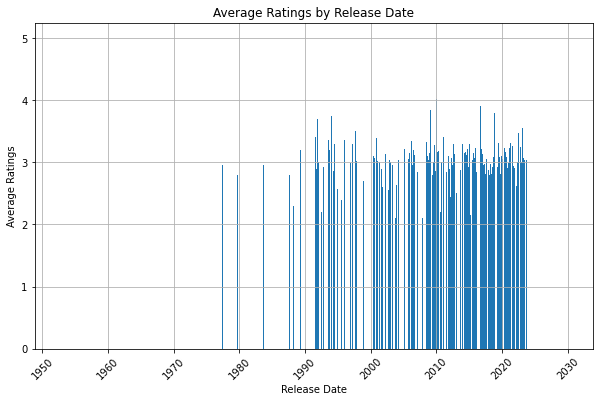

In [32]:
# Group the data by 'Release_Date' and calculate the mean of 'Ratings' for each date
ratings_by_date = df.groupby('Release_Date')['Rating'].mean().reset_index()

# Plotting the bar graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as per your preference

plt.bar(ratings_by_date['Release_Date'], ratings_by_date['Rating'])

plt.xlabel('Release Date')
plt.ylabel('Average Ratings')
plt.title('Average Ratings by Release Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better visibility

plt.show()

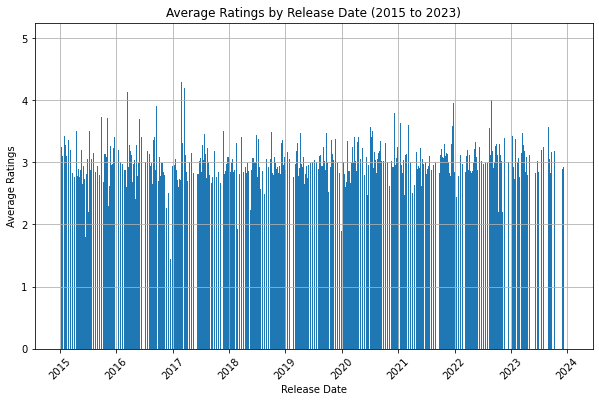

In [37]:
# Filter the DataFrame to include data from 2015 to 2023
df_2015_to_2023 = df[(df['Release_Date'].dt.year >= 2015) & (df['Release_Date'].dt.year <= 2023)]

# Group the filtered data by 'Release_Date' and calculate the mean of 'Ratings' for each date
ratings_by_date = df_2015_to_2023.groupby('Release_Date')['Rating'].mean().reset_index()

# Plotting the bar graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as per your preference

plt.bar(ratings_by_date['Release_Date'], ratings_by_date['Rating'])

plt.xlabel('Release Date')
plt.ylabel('Average Ratings')
plt.title('Average Ratings by Release Date (2015 to 2023)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better visibility

plt.show()

In [73]:
# Filter the DataFrame to include data from 2015 to 2023
df_2015_to_2023 = df[(df['Release_Date'].dt.year >= 2015) & (df['Release_Date'].dt.year <= 2023)]

# Group the filtered data by 'Release_Date' and calculate the mean of 'Ratings' for each date
ratings_by_date = df_2015_to_2023.groupby('Release_Date')['Rating'].mean().reset_index()

# Create an interactive bar graph using Plotly Express
fig = px.bar(ratings_by_date, x='Release_Date', y='Rating', 
             labels={'Release_Date': 'Release Date', 'Rating': 'Average Ratings'},
             title='Average Ratings by Release Date (2015 to 2023)')

# Update the layout to use the 'plotly_dark' theme and make the bars white
fig.update_layout(template='plotly_dark')
fig.update_traces(marker_color='white')

fig.show()

In [58]:
# Get the top 5 genres by occurrence
top_5_genres = df['Genres'].value_counts().head(5).index

# Filter the DataFrame to include only the top 5 genres
df_top_5_genres = df[df['Genres'].isin(top_5_genres)]

# Group the data by 'Genres' and calculate the mean of 'Ratings' for each genre
genre_ratings = df_top_5_genres.groupby(['Genres', 'Release_Date'])['Rating'].mean().reset_index()

# Create an interactive line graph using Plotly Express
fig = px.line(genre_ratings, x='Release_Date', y='Rating', color='Genres',
              labels={'Release_Date': 'Release Date', 'Rating': 'Average Ratings'},
              title='Top 5 Genres by Occurrence: Ratings over Time',
              template='plotly_dark')

fig.show()

In [61]:
fig = px.scatter(df, x='Wishlist', y='Rating',
                 labels={'Wishlist': 'Wishlist', 'Rating': 'Rating'},
                 title='Wishlist vs. Rating',
                 template='plotly_dark',
                 hover_name='Title') 

# Update the appearance of the scatter plot
fig.update_traces(marker=dict(color='white', size=10, opacity=0.7),
                  selector=dict(mode='markers'))

# Update the layout of the graph
fig.update_layout(showlegend=True, legend_title_text='Genres', legend_bgcolor='rgba(0,0,0,0)')

fig.show()

In [64]:
# Calculate the average rating for each developer
developer_ratings = df.groupby('Developers')['Rating'].mean().reset_index()

# Sort the developers based on their average rating in descending order
developer_ratings = developer_ratings.sort_values(by='Rating', ascending=False)

# Create a bar plot using Plotly Express
fig = px.bar(developer_ratings.head(20), x='Developers', y='Rating',
             labels={'Developers': 'Developers', 'Rating': 'Average Rating'},
             title='Top 20 Developers with the Highest Ratings',
             template='plotly_dark')

# Update the layout of the graph
fig.update_layout(showlegend=False)

fig.show()

In [75]:
developer_ratings = developer_ratings.sort_values(by='Rating', ascending=True)

# Create a bar plot using Plotly Express
fig = px.bar(developer_ratings.head(10), x='Developers', y='Rating',
             labels={'Developers': 'Developers', 'Rating': 'Average Rating'},
             title='Top 10 Developers with the Lowest Ratings',
             template='plotly_dark')

# Update the layout of the graph
fig.update_layout(showlegend=False)

fig.show()

In [68]:
import plotly.express as px

# Create a scatter plot using Plotly Express
fig = px.scatter(df, x='Rating', y='Plays', title='Relationship between Rating and Plays',
                 labels={'Rating': 'Rating', 'Plays': 'Plays'},
                 hover_name='Title',  # Adding the 'Title' column as hover label
                 template='plotly_dark')

# Update the layout of the graph
fig.update_layout(showlegend=False)

fig.show()


In [69]:
df_filtered = df[df['Release_Date'].dt.year > 2015]

# Group by 'Title' to find the sum of 'Plays' for each game
most_played_games = df_filtered.groupby('Title')['Plays'].sum().reset_index()

# Sort the DataFrame by 'Plays' in descending order to get the most played games first
most_played_games = most_played_games.sort_values(by='Plays', ascending=False)

# Get the top 10 most played games
top_10_played_games = most_played_games.head(10)

# Merge the top 10 most played games DataFrame with the original DataFrame to get their genres
top_10_played_games_with_genre = pd.merge(top_10_played_games, df[['Title', 'Genres']], on='Title', how='left')

# Create the bar plot using Plotly Express
fig = px.bar(top_10_played_games_with_genre, x='Plays', y='Title', color='Genres',
             title='Top 10 Most Played Games and Their Genres (Released after 2015)',
             labels={'Plays': 'Total Plays', 'Title': 'Game Title', 'Genres': 'Genre'},
             template='plotly_dark', text='Plays', orientation='h')

# Update the layout of the graph
fig.update_layout(showlegend=True, legend_title_text='Genre')

fig.show()